## ODYSEA Swath Simulator Examples

This notebook contains examples for constructing an ODYSEA orbital swath, co-locating model data, and adding expected instrument errors.

These simplified simulations are part of a much larger WaCM simulation capability at JPL, where the actual instrument, sampling, and science performance are generated.

Want to contrubite? Please do! Ask wineteer@jpl.nasa.gov how to get involved.

## Imports and classes

In [1]:
%load_ext autoreload
%autoreload 2

In [1]:
from swath_sampling import OdyseaSwath
from errors import OdyseaErrors
from colocate_model import GriddedModel, addTimeDim

import numpy as np
import scipy
import matplotlib
import matplotlib.pyplot as plt
import datetime
import itertools

font = {'weight' : 'bold',
        'size'   : 22}
matplotlib.rc('font', **font)

matplotlib.rc('font', **font)
matplotlib.rc('lines',linewidth=4)
matplotlib.rc('text',usetex=False)

matplotlib.rcParams.update({"axes.grid" : True, "grid.color": "black"})

# Part 1: Swath Based Sampling
## Initialize the WaCM swath object

In [2]:
odysea = OdyseaSwath(orbit_fname='orbit_out_2020_2023_height590km.npz')

## Create an orbit generator object between two dates
Note that the provided orbit is currently 2020-2023

In [3]:
start_time = datetime.datetime.strptime('2020-01-22:12','%Y-%M-%d:%H')
end_time = datetime.datetime.strptime('2020-01-25:12','%Y-%M-%d:%H')

orbits = odysea.getOrbits(start_time = start_time,end_time = end_time)

## Grab the first xarray dataset orbit

In [13]:
%%time
o = next(orbits)
display(o)

<xarray.Dataset>
Dimensions:         (along_track: 8000, cross_track: 340)
Coordinates:
  * along_track     (along_track) int64 0 1 2 3 4 5 ... 7995 7996 7997 7998 7999
  * cross_track     (cross_track) int64 0 1 2 3 4 5 ... 334 335 336 337 338 339
Data variables:
    sample_time     (along_track, cross_track) datetime64[ns] 2020-01-22T20:1...
    lat             (along_track, cross_track) float32 5.668 5.669 ... -15.78
    lon             (along_track, cross_track) float32 44.6 44.56 ... 21.66
    swath_blanking  (cross_track) bool True True True True ... True True True
    encoder_fore    (along_track, cross_track) float64 -90.0 -83.77 ... 90.0
    encoder_aft     (along_track, cross_track) float64 -90.0 -96.23 ... 90.0
    azimuth_fore    (along_track, cross_track) float64 -90.0 -83.77 ... -78.09
    azimuth_aft     (along_track, cross_track) float64 -90.0 -96.23 ... -78.09
    bearing         (along_track) float64 5.56e-05 -124.4 ... -168.1 -168.1
Attributes: (12/14)
    title:                Odysea Simple Orbit Sampling V0.1
    project:              Odysea
    summary:              Simplified orbit sampling assuming basic Odysea orb...
    references:           Rodriguez 2018, Wineteer 2020
    institution:          Jet Propulsion Laboratory (JPL)
    creator_name:         Alexander Wineteer
    ...                   ...
    geospatial_lat_min:   -89.99N
    geospatial_lat_max:   89.99N
    geospatial_lon_min:   -180.00E
    geospatial_lon_max:   180.00E
    time_coverage_start:  2020-01-22 20:12:00.058682
    time_coverage_end:    2020-01-22 21:38:58.068192

CPU times: user 16.6 s, sys: 118 ms, total: 16.7 s
Wall time: 16.8 s


## Create a gridded model object to hold model data

In [3]:
# This object should be modified to support your own ocean model.

model = GriddedModel(preprocess=addTimeDim)
model.U

<xarray.Dataset>
Dimensions:  (time: 100, lat: 4501, lon: 9000)
Coordinates:
  * time     (time) datetime64[ns] 2020-01-19T21:00:00 ... 2020-01-24
  * lat      (lat) float64 -90.0 -89.96 -89.92 -89.88 ... 89.88 89.92 89.96 90.0
  * lon      (lon) float64 -180.0 -180.0 -179.9 -179.9 ... 179.9 179.9 180.0
Data variables:
    U        (time, lat, lon) float64 dask.array<chunksize=(1, 4501, 9000), meta=np.ndarray>

## Initialize the ODYSEA error object

In [6]:
# This class holds all functions for generating wind and current uncertainties.
e = OdyseaErrors()

## Co-locate model currents and winds to the orbit swath

In [17]:
o = model.colocateSwathCurrents(o)
o = model.colocateSwathWinds(o)

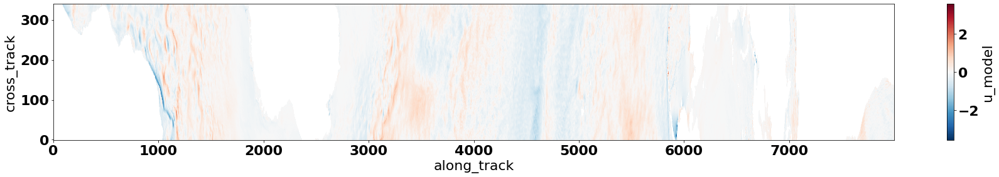

In [18]:
o.u_model.T.plot(figsize=(30,4))

## Set surface current uncertainties (radial and geographic)

In [10]:
o = e.setCurrentErrors(o,etype='simulated_baseline',wind_speed=7,wind_dir=0)

## Show the expected radial velocity standard deviation for foreward and backard looks

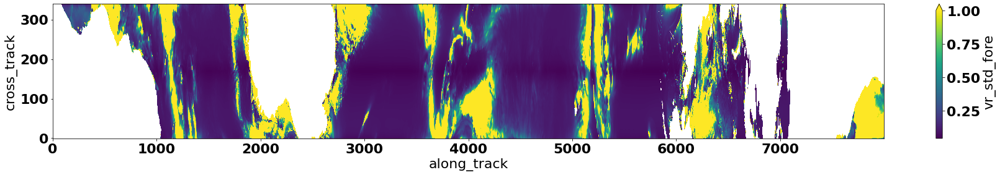

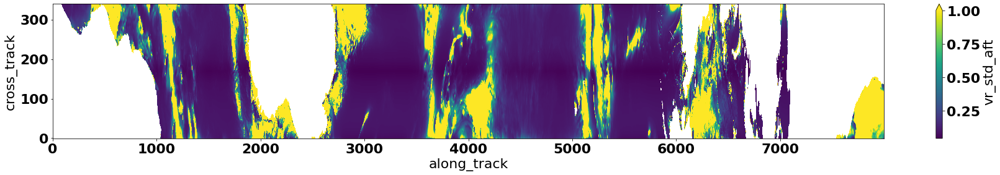

In [11]:
o.vr_std_fore.T.plot(figsize=(30,4),vmax=1)
o.vr_std_aft.T.plot(figsize=(30,4),vmax=1)

## Show the expected geographic u/v surface current standard deviation

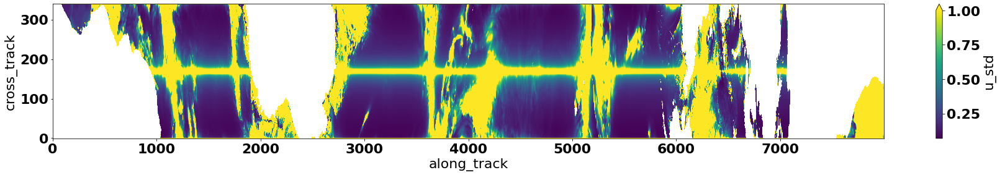

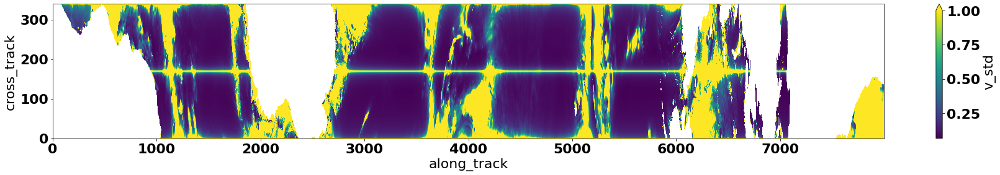

In [12]:
o.u_std.T.plot(figsize=(30,4),vmax=1)
o.v_std.T.plot(figsize=(30,4),vmax=1)

## Show the geographic u/v surface current errors drawn from a gaussian distribution of the above standard deviations

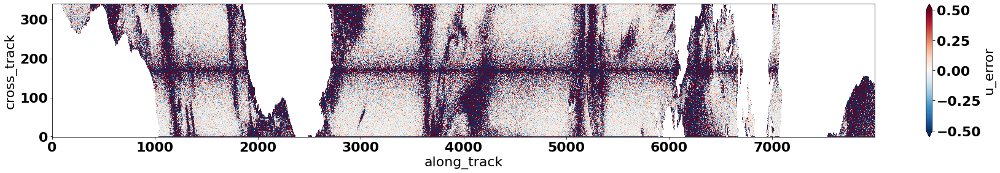

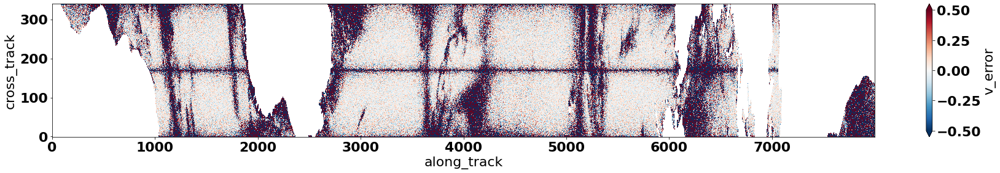

In [13]:
o.u_error.T.plot(figsize=(30,4),vmax=.5)
o.v_error.T.plot(figsize=(30,4),vmax=.5)

## Look at the cross-swath averaged surface current performance for u/v (above plots averaged). 
Do not include for winds < 3m/s and center/edges of the swath where blanking is set.

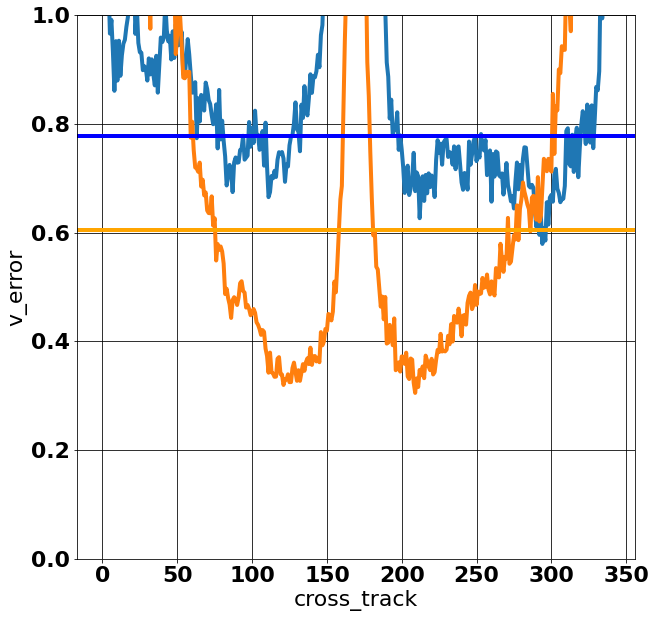

In [14]:
speed_mask = o.wind_speed_model < 3

o.u_error.values[speed_mask] = np.nan
o.v_error.values[speed_mask] = np.nan

np.sqrt((o.u_error**2).mean(axis=0)).plot(ylim=(0,1),figsize=(10,10))
np.sqrt((o.v_error**2).mean(axis=0)).plot(ylim=(0,1))

mean_u_err = np.nanmean(o.u_error.std(axis=0)[o.swath_blanking==0])
mean_v_err = np.nanmean(o.v_error.std(axis=0)[o.swath_blanking==0])

plt.axhline(mean_u_err,color='blue')
plt.axhline(mean_v_err,color='orange')

In [26]:
from cartopy import config
import cartopy.crs as ccrs
from scipy import stats
from global_land_mask import globe

import os
os.environ["CARTOPY_USER_BACKGROUNDS"] = "/home/wineteer/WACM/odysea-simulator/cartopy_files/"

def makePlot(lon,lat,data,vmin,vmax,cblabel,colormap,figsize=(20,10),bg=True,gridMe=False,is_err=False,check_percent_covered=False):

    
    if gridMe:
        
        mask = np.isfinite(lon+lat+data)

        
        lon_lin = np.arange(-180,180,.1)
        lat_lin = np.arange(-90,90,.1)

        lon_mesh,lat_mesh = np.meshgrid((lon_lin[1::]+lon_lin[0:-1])/2,(lat_lin[1::]+lat_lin[0:-1])/2)
        
        data, bin_edges, binnumber = scipy.stats.binned_statistic_dd([lon[mask],lat[mask]],values=data[mask],statistic='mean',bins=[lon_lin,lat_lin])
        
        if check_percent_covered:
            is_ocean = globe.is_ocean(lat_mesh, lon_mesh)
            percent_covered = 100*np.nansum(np.isfinite(data) & is_ocean.T)/np.nansum(is_ocean)
            print('Percent ocean coverage: ' + str(percent_covered))
            
#         if is_err == True
#             counts, bin_edges, binnumber = scipy.stats.binned_statistic_dd([lon[mask],lat[mask]],values=data[mask],statistic='counts',bins=[lon_lin,lat_lin])
#             data = data/np.sqrt(counts)
            
        data = data.T
        lon = lon_mesh
        lat = lat_mesh
    
    fig = plt.figure(figsize=figsize)
    #ax = plt.subplot(111, projection=ccrs.Orthographic(-65, 15))
    ax = plt.subplot(111, projection=ccrs.PlateCarree())

    if bg:
        ax.background_img(name='BM', resolution='low')

    
    plt.pcolormesh(lon, lat, data,transform=ccrs.PlateCarree(),vmax=vmax,vmin=vmin,cmap=colormap)

    ax.coastlines()
    #plt.colorbar(label=cblabel,orientation='horizontal',fraction=0.046, pad=0.04)

    fig.tight_layout()

    
    plt.show()

In [27]:
import xarray as xr
sb,tx = xr.broadcast(o.swath_blanking,o.tx_model)

In [29]:
tx.values[sb==True] = np.nan

## Colocate and look at a day worth of orbits

In [25]:
from tqdm import tqdm
import xarray as xr

start_time = datetime.datetime.strptime('2020-01-22:12','%Y-%M-%d:%H')
end_time = datetime.datetime.strptime('2020-01-23:12','%Y-%M-%d:%H')

odysea = OdyseaSwath(orbit_fname='orbit_out_2020_2023_height590km.npz') #orbit_out_2020_2023_height590km
orbits = odysea.getOrbits(start_time = start_time,end_time = end_time,set_azimuth=False)
model = GriddedModel(preprocess=addTimeDim)


lons = []
lats = []
us = []
u10s = []


#for o in tqdm(itertools.islice(orbits, 2)):    
for o in tqdm(orbits):    

    o = model.colocateSwathCurrents(o)
    #o = model.colocateSwathWinds(o)
    
    u = np.sqrt(o.u_model.values**2 + o.v_model.values**2)
    #u10 = o.wind_speed_model.values
    
    ###### THIS LINE REMOVES SWATH BLANKING AREAS
    sb,_ = xr.broadcast(o.swath_blanking,o.u_model)
    u[sb.T==True] = np.nan
    
    ####### THIS LINE REMOVES LOW WIND AREAS
#     sb,_ = xr.broadcast(o.swath_blanking,o.u_model)
#     u[sb.T==True] = np.nan
    
    
    lons = np.append(lons,o.lon)
    lats = np.append(lats,o.lat)
    us = np.append(us,u)
    #u10s = np.append(u10s,u10)



#makePlot(lons,lats,us,vmin=0,vmax=1,cblabel='Model Surface Current Speed [m/s]',colormap='plasma',figsize=(20,10),bg=False,gridMe=True)
#makePlot(lons,lats,u10s,vmin=0,vmax=15,cblabel='Model 10m Wind Speed [m/s]',colormap='viridis',figsize=(20,10),bg=False,gridMe=True)

0it [00:00, ?it/s]

43990886.58863258


1it [00:16, 16.07s/it]

43533621.93516922


2it [00:32, 16.12s/it]

43990886.29341507


3it [00:47, 15.70s/it]

43533621.261636734


4it [01:03, 15.89s/it]

43990885.9868412


5it [01:19, 16.05s/it]

43533620.56231117


6it [01:35, 15.98s/it]

43990885.66737366


7it [01:52, 16.08s/it]

43533619.83635521


8it [02:07, 15.83s/it]

43990885.33514595


9it [02:23, 16.01s/it]

43533619.084495544


10it [02:40, 16.10s/it]

43990884.991104126


11it [02:55, 15.90s/it]

43533618.30802345


12it [03:12, 16.32s/it]

43990884.63692474


13it [03:28, 16.18s/it]

43533617.50867844


14it [03:44, 16.04s/it]


Percent ocean coverage: 77.67143564651747


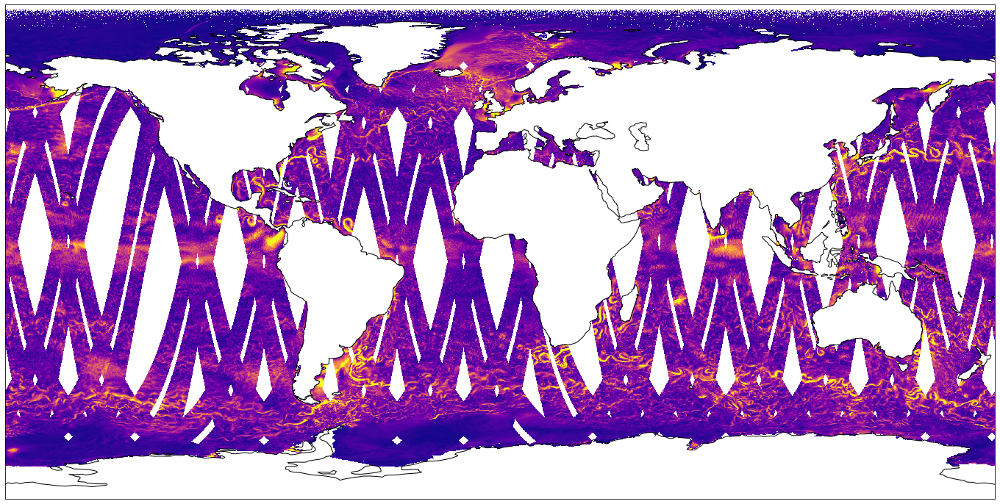

In [27]:
makePlot(lons,lats,us,vmin=0,vmax=1,cblabel='Model Surface Current Speed [m/s]',colormap='plasma',figsize=(20,10),bg=False,gridMe=True,check_percent_covered=True)
#makePlot(lons,lats,u10s,vmin=0,vmax=15,cblabel='Model 10m Wind Speed [m/s]',colormap='viridis',figsize=(20,10),bg=False,gridMe=True)

<Figure size 2160x504 with 0 Axes>

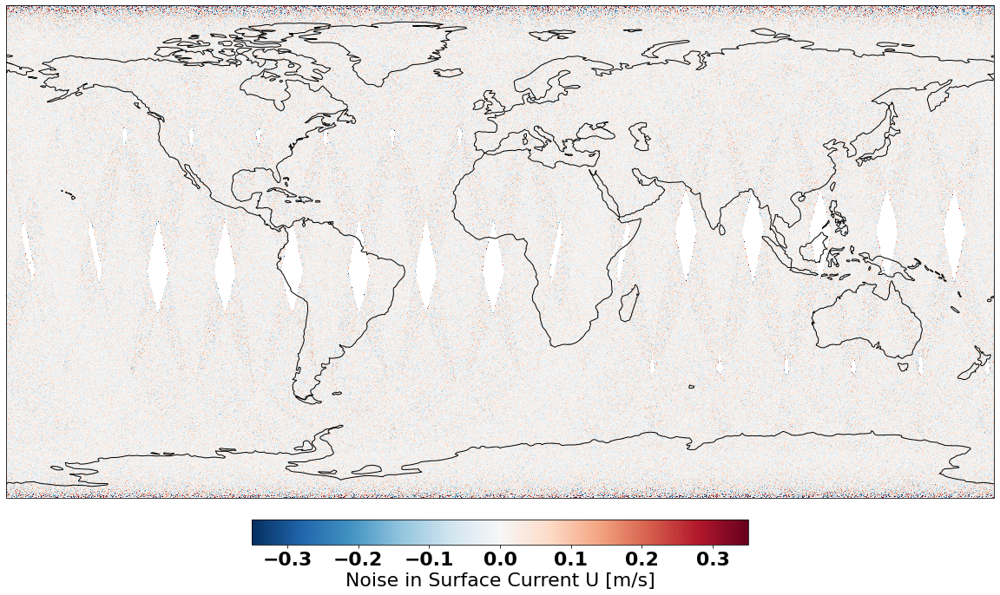

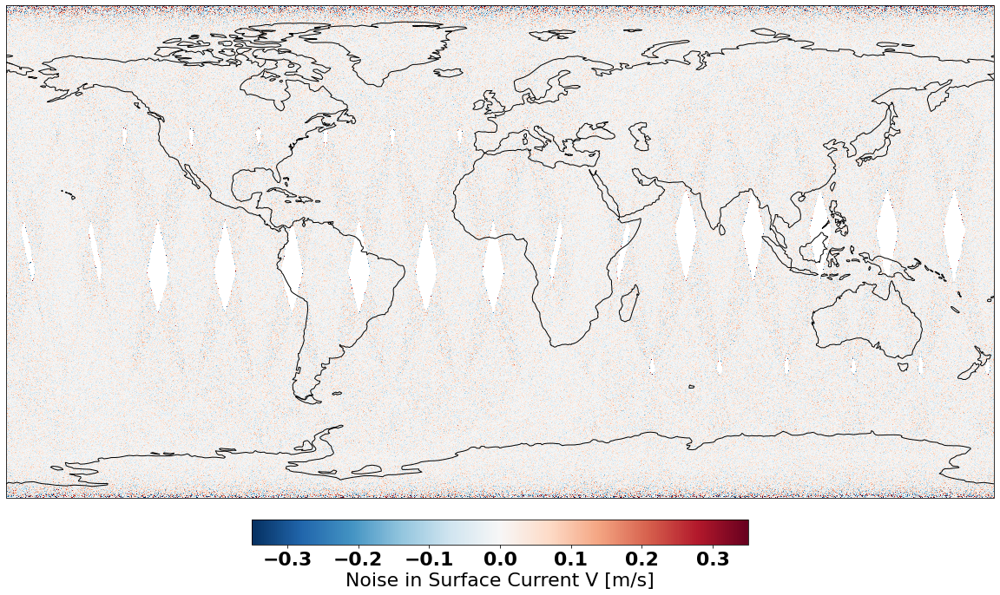

In [27]:
import scipy

plt.figure(figsize=(30,7))

lons = []
lats = []
us = []
vs = []

for o in itertools.islice(orbits, 16):

    o = coas_model.colocateModelSwathCurrents(o)
    o = coas_model.colocateModelSwathWinds(o)
    
    o = wxt.setCurrentErrors(o,resolution=5000)
    o = wxt.setWindErrors(o,resolution=5000)
    
    u = o['u_error'].values
    v = o['v_error'].values
    
    mask = np.isnan(o.u_model.values)
    
    u[mask] = np.nan
    v[mask] = np.nan

    
    lons = np.append(lons,o.lon)
    lats = np.append(lats,o.lat)
    us = np.append(us,u)
    vs = np.append(vs,v)




makePlot(lons,lats,us,vmin=-.35,vmax=.35,cblabel='Noise in Surface Current U [m/s]',colormap='RdBu_r',figsize=(20,10),bg=False,gridMe=True,is_err=True)
makePlot(lons,lats,vs,vmin=-.35,vmax=.35,cblabel='Noise in Surface Current V [m/s]',colormap='RdBu_r',figsize=(20,10),bg=False,gridMe=True,is_err=True)


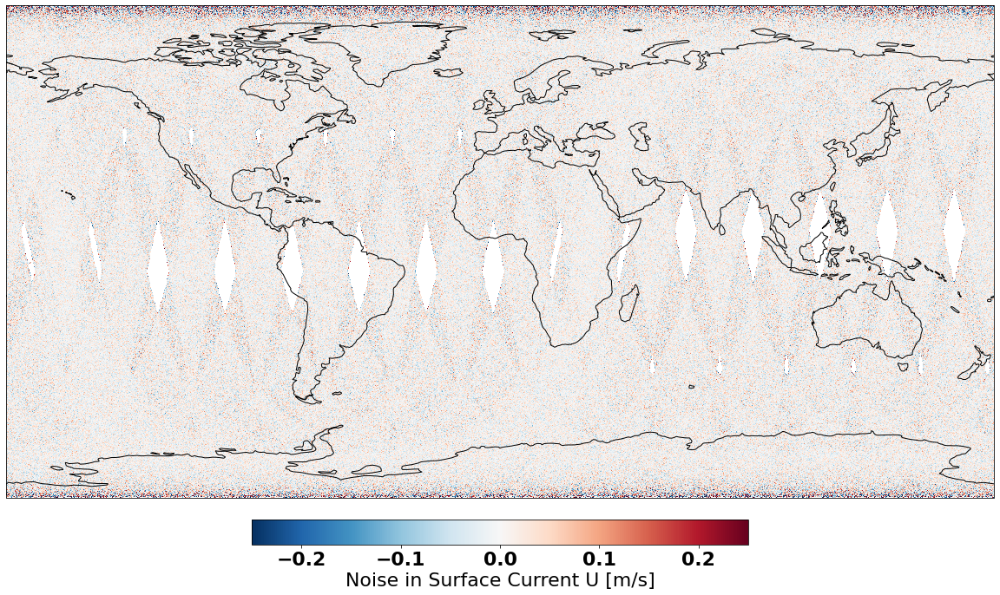

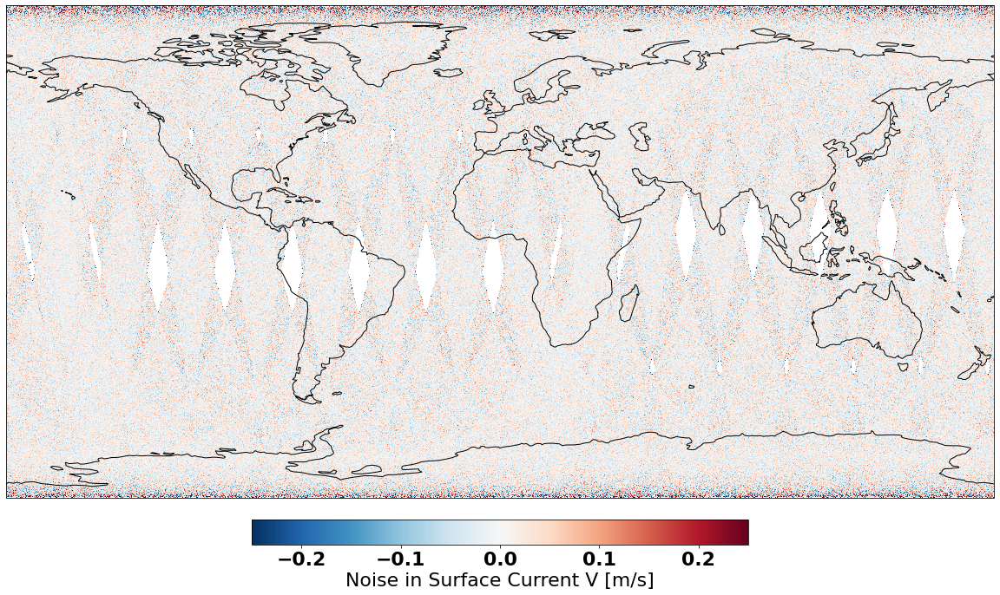

In [30]:
makePlot(lons,lats,us,vmin=-.25,vmax=.25,cblabel='Noise in Surface Current U [m/s]',colormap='RdBu_r',figsize=(20,10),bg=False,gridMe=True)
makePlot(lons,lats,vs,vmin=-.25,vmax=.25,cblabel='Noise in Surface Current V [m/s]',colormap='RdBu_r',figsize=(20,10),bg=False,gridMe=True)

## Estimate the errors

In [11]:
o = wxt.setCurrentErrors(o,resolution=5000)
o = wxt.setWindErrors(o,resolution=5000)

AttributeError: 'Dataset' object has no attribute 'wind_speed_model'

In [ ]:
o

## Show the errors

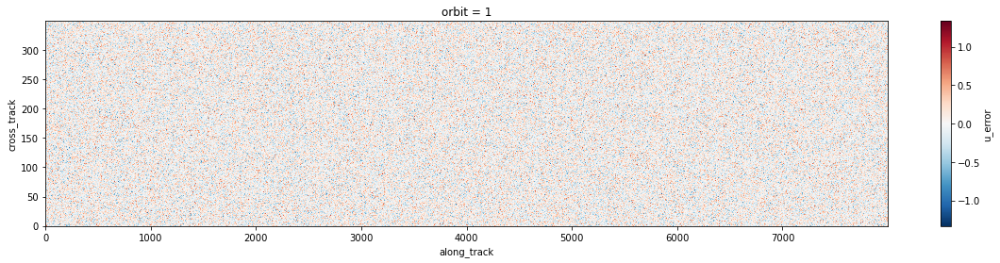

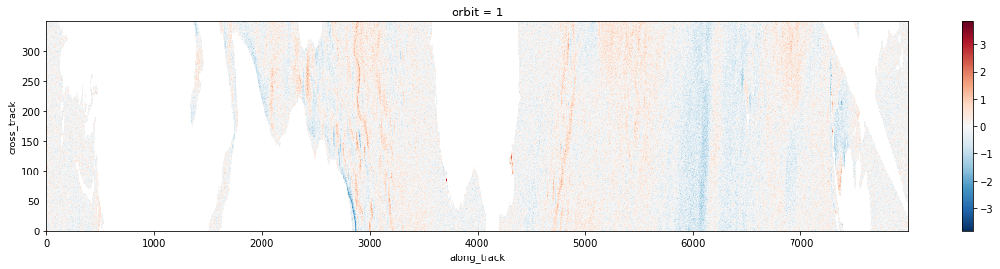

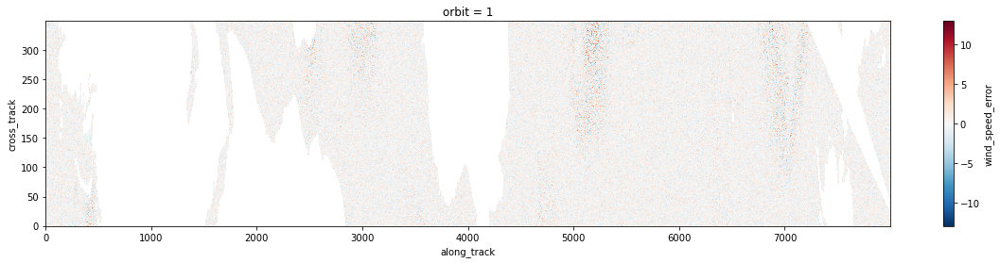

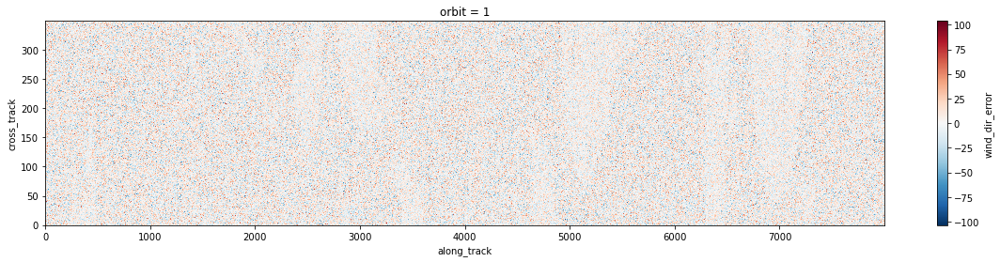

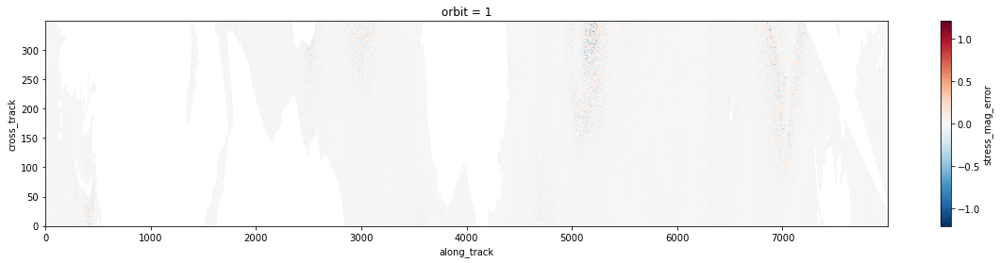

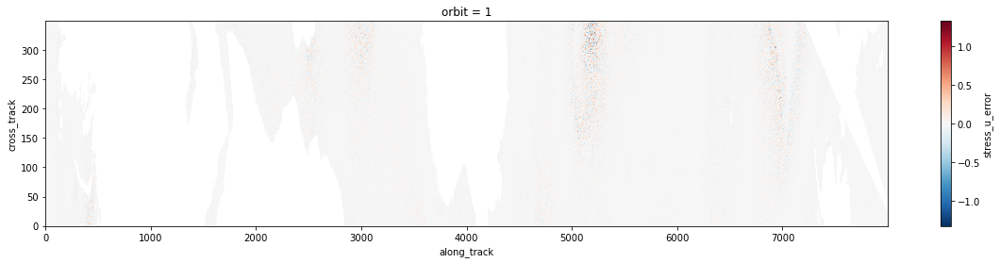

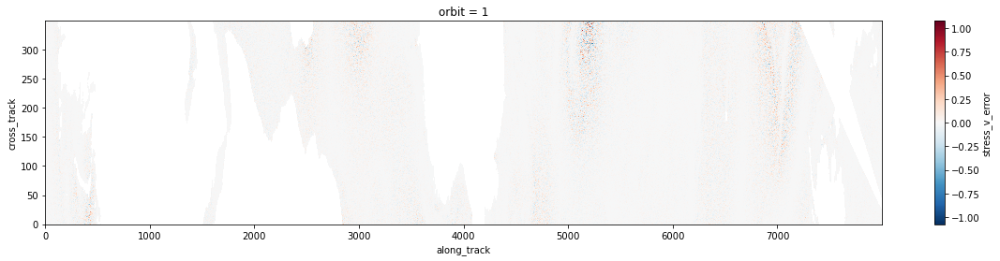

In [12]:
plt.figure(figsize=(20,4))
o['u_error'].T.plot()
plt.show()

plt.figure(figsize=(20,4))
(o['u_error']+o['u_model']).T.plot()
plt.show()

plt.figure(figsize=(20,4))
o['wind_speed_error'].T.plot()
plt.show()

plt.figure(figsize=(20,4))
(o['wind_dir_error']).T.plot()
plt.show()

plt.figure(figsize=(20,4))
o['stress_mag_error'].T.plot()
plt.show()

plt.figure(figsize=(20,4))
(o['stress_u_error']).T.plot()
plt.show()

plt.figure(figsize=(20,4))
(o['stress_v_error']).T.plot()
plt.show()

# Part 2: Lat/Lon Time Sampling
## Initialize the WaCM lat/lon gridded sampling object

In [13]:
w = wacmLatLon()

## Load the pre-generated sampling file

In [14]:
w.loadSampling(fn = '/u/bura-m0/wineteer/wacm/wacm_simple_sampling/wacm_simple_orbit_s2012-01-01 21:11:04.301710e2012-01-05 20:54:17.444398.nc')

## Show the sampling file, gridded in lat/lon

In [15]:
w.sampling

<xarray.Dataset>
Dimensions:      (lon: 1439, lat: 719, orbit: 59)
Coordinates:
  * lon          (lon) float32 -179.9 -179.6 -179.4 -179.1 ... 179.1 179.4 179.6
  * lat          (lat) float32 -89.88 -89.62 -89.38 -89.12 ... 89.12 89.38 89.62
  * orbit        (orbit) uint16 0 1 2 3 4 5 6 7 8 ... 50 51 52 53 54 55 56 57 58
Data variables:
    sample_time  (orbit, lat, lon) datetime64[ns] NaT NaT NaT ... NaT NaT NaT
Attributes: (12/24)
    title:                   WaCM Simple Orbit Sampling V0.1
    project:                 WaCM
    summary:                 Simplified orbit sampling assuming basic WaCM or...
    references:              Rodriguez 2018, Wineteer 2020
    institution:             Jet Propulsion Laboratory (JPL)
    creator_name:            Alexander Wineteer
    ...                      ...
    Eccentricity:            0.0010541048021843733
    Keplerian Period [min]:  97.36056194760529
    Nodal Period [min]:      97.28889400915382
    Local Incidence:         59.60449325424928
    Look Angle:              51.75
    Swath Width:             1748716.3790044633

In [16]:

lats = np.arange(-90,90)
lons = np.arange(-180,180)

lats,lons = np.meshgrid(lats,lons)

st = w.getSamplingTimes(lats=lats.flatten(),
                        lons=lons.flatten(),
                        start_time = np.datetime64('2020-08-01'),
                        end_time   = np.datetime64('2020-09-01'))

tt=[]
tmin=[]

for ss in st:
    if len(ss) > 0:
        tt.append(np.nanmean((np.diff(ss)/np.timedelta64(1,'h'))))
        tmin.append(np.nanmin((np.diff(ss)/np.timedelta64(1,'h'))))
    else:
        tt.append(np.nan)
        tmin.append(np.nan)


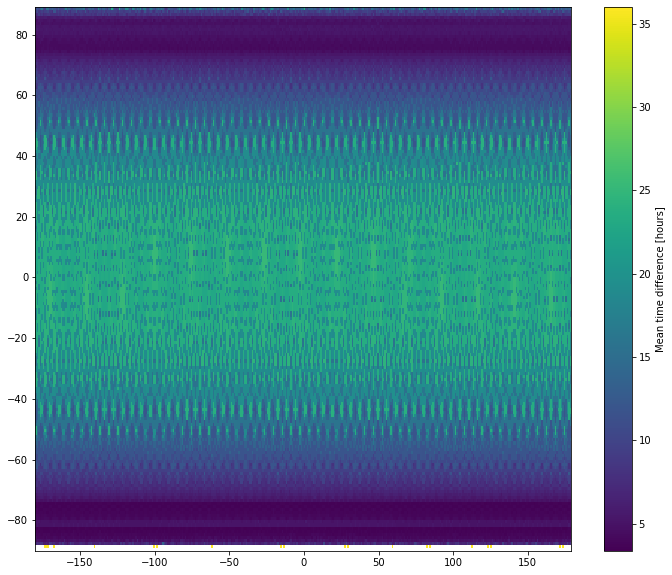

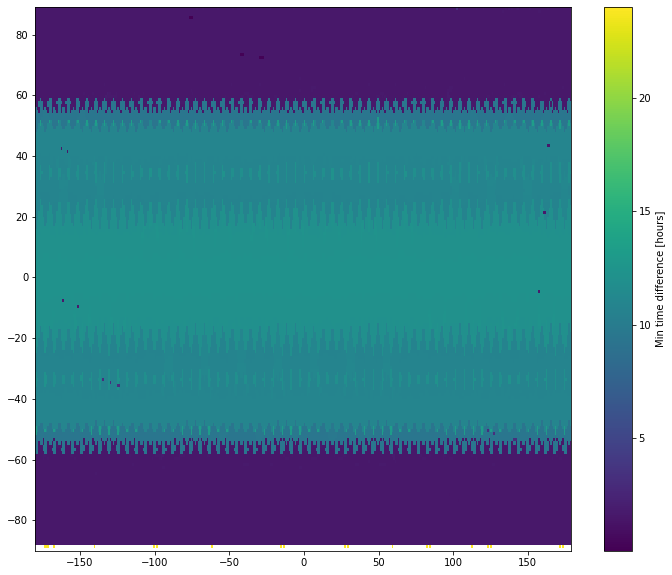

In [17]:
tt = np.reshape(tt,np.shape(lons))
tmin = np.reshape(tmin,np.shape(lons))

plt.figure(figsize=(12,10))
plt.pcolormesh(lons,lats,tt,vmax=36)
plt.colorbar(label='Mean time difference [hours]')
plt.show()

plt.figure(figsize=(12,10))
plt.pcolormesh(lons,lats,tmin,vmax=24)
plt.colorbar(label='Min time difference [hours]')
plt.show()

## Query out sampling at user requested locations for a desired time period

In [18]:
%%time

lats = range(-90,90)
lons = range(-180,180)

lons,lats = np.meshgrid(lons,lats)

st = w.getSamplingTimes(lats=lats.flatten(),
                        lons=lons.flatten(),
                        start_time = np.datetime64('2020-08-01'),
                        end_time   = np.datetime64('2020-09-01'))


CPU times: user 4.19 s, sys: 32.5 ms, total: 4.22 s
Wall time: 4.21 s


## Show the resulting time sampling at one of the points

In [19]:
st[30000]

array(['2020-08-01T08:32:00.000000000', '2020-08-01T20:39:28.000000000',
       '2020-08-02T08:53:20.000000000', '2020-08-02T20:58:40.000000000',
       '2020-08-05T08:32:00.000000000', '2020-08-05T20:39:28.000000000',
       '2020-08-06T08:53:20.000000000', '2020-08-06T20:58:40.000000000',
       '2020-08-09T08:32:00.000000000', '2020-08-09T20:39:28.000000000',
       '2020-08-10T08:53:20.000000000', '2020-08-10T20:58:40.000000000',
       '2020-08-13T08:32:00.000000000', '2020-08-13T20:39:28.000000000',
       '2020-08-14T08:53:20.000000000', '2020-08-14T20:58:40.000000000',
       '2020-08-17T08:32:00.000000000', '2020-08-17T20:39:28.000000000',
       '2020-08-18T08:53:20.000000000', '2020-08-18T20:58:40.000000000',
       '2020-08-21T08:32:00.000000000', '2020-08-21T20:39:28.000000000',
       '2020-08-22T08:53:20.000000000', '2020-08-22T20:58:40.000000000',
       '2020-08-25T08:32:00.000000000', '2020-08-25T20:39:28.000000000',
       '2020-08-26T08:53:20.000000000', '2020-08-26

## Pull errors for these samples at 25km resolution 

In [20]:
errors = [w.getErrors(resolution=25000,size=np.shape(t)) for t in st]

In [21]:
errors[1000]

array([-0.08771244, -0.11442092,  0.02358807, -0.03040095,  0.05632177,
       -0.0341535 ,  0.01271974, -0.00643113,  0.04192397,  0.01265572,
       -0.00974493,  0.02725374, -0.06012596, -0.03766397, -0.03161303,
        0.01433215, -0.11244608, -0.00908953,  0.0455577 , -0.01377456,
        0.03956554, -0.06739225, -0.07961041,  0.05292343, -0.02676458,
        0.21105695,  0.03504585,  0.08067446,  0.08618521,  0.09067608,
       -0.02553034, -0.01236288, -0.04562772, -0.08257593,  0.00704554,
        0.18671319, -0.15266768,  0.01092812,  0.0177615 ,  0.08049755,
       -0.11029384, -0.02896795, -0.04763767, -0.03969021,  0.0323288 ,
        0.1419436 ,  0.02633447, -0.10511709,  0.08249235,  0.04379949,
       -0.00332968,  0.05305091,  0.03833296,  0.00056718, -0.10692298,
        0.03488488,  0.06035904,  0.12628682,  0.06343573, -0.02139639,
       -0.02941489, -0.02986542,  0.0490266 , -0.08454516, -0.10070992,
       -0.00361863, -0.14922237,  0.06939825,  0.07380529,  0.08

In [142]:
# this technically works, but is very very very slow.
model_uv = [coas_model.colocateModelPoints(lats.flatten()[i]*np.ones(len(st[i])),lons.flatten()[i]*np.ones(len(st[i])),st[i]) for i in range(0,len(st))]

In [4]:
from cartopy import config
import cartopy.crs as ccrs
from scipy import stats

def makePlot(lon,lat,data,vmin,vmax,cblabel,colormap,figsize=(20,10),bg=False,gridMe=False,is_err=False):

    
    if gridMe:
        
        mask = np.isfinite(lon+lat+data)

        
        lon_lin = np.arange(-180,180,.25)
        lat_lin = np.arange(-90,90,.25)

        lon_mesh,lat_mesh = np.meshgrid((lon_lin[1::]+lon_lin[0:-1])/2,(lat_lin[1::]+lat_lin[0:-1])/2)
        
        data, bin_edges, binnumber = scipy.stats.binned_statistic_dd([lon[mask],lat[mask]],values=data[mask],statistic='mean',bins=[lon_lin,lat_lin])
        
#         if is_err == True
#             counts, bin_edges, binnumber = scipy.stats.binned_statistic_dd([lon[mask],lat[mask]],values=data[mask],statistic='counts',bins=[lon_lin,lat_lin])
#             data = data/np.sqrt(counts)
            
        data = data.T
        lon = lon_mesh
        lat = lat_mesh
    
    fig = plt.figure(figsize=figsize)
    ax = plt.subplot(111, projection=ccrs.PlateCarree())
    
    if bg:
        ax.background_img(name='BM', resolution='high')

    
    
    plt.pcolormesh(lon, lat, data,transform=ccrs.PlateCarree(),vmax=vmax,vmin=vmin,cmap=colormap)

    ax.coastlines()
    plt.colorbar(label=cblabel,orientation='horizontal',fraction=0.046, pad=0.04)

    fig.tight_layout()

    
    plt.show()